# Media Architecture Community on Twitter

How do they speak of architecture, the digital, place and place-making....?

* identifying the community
    * automate the search for tweets that mention conference hashtags: #MAB12, #MAB14, #MAB16, #MAB18 and the more general #mediaarchitecture)
    * automatically retreive account names that use the hashtag, as well as the extended community - accounts that retweet and like those tweets
    * manually review the profiles profiles, looking at profile descriptions and in some cases the latest several tweets in order to determine the relevance of the account in the discourse 
    * create the list (set(mabs)) and write to a file
    * for each account on the list, find the userID, write that to a new list
    
* scrape all the tweets from the list of accounts
    * for account in the list of accounts, scrape all the tweets, 
    * write to a .json file

In [1]:
# IDENTIFY THE COMMUNITY
import pickle
mabs_names = pickle.load( open("mabs_names.p", "rb"))
len(mabs_names)

249

In [ ]:
# convert screen_names to userIDs
from twython import Twython, TwythonError
from auth import TwitterAuthProfiles
twitter = Twython(TwitterAuthProfiles.consumer_key, TwitterAuthProfiles.consumer_secret, oauth_version=2)
ACCESS_TOKEN = twitter.obtain_access_token()
twitter = Twython(TwitterAuthProfiles.consumer_key, access_token=ACCESS_TOKEN)

screen_names_withoutat = []
for i in mabs_names:
  screen_names_withoutat.append(i[1:])

userID_list = []
for user in screen_names_withoutat:
    try:
        userID=twitter.lookup_user(screen_name=user)
        userID_list.append(str(userID[0]["id_str"]))
    except TwythonError as e:
        print(e.error_code)
        print(user)
        continue
        
#check if it worked:
print(screen_names_withoutat[66], userID_list[66])

# write the list of usedIDs to a file
pickle.dump(userID_list, open("mabs_ids.p", "wb"))

In [38]:
# SCRAPING TWEETS USING TWEEPY
from tweepy import API, OAuthHandler
from auth import TwitterAuthProfiles

auth = OAuthHandler(TwitterAuthProfiles.consumer_key, TwitterAuthProfiles.consumer_secret)
auth.set_access_token(TwitterAuthProfiles.access_token, TwitterAuthProfiles.access_token_secret)
api = API(auth)

In [ ]:
from getallusertweets import get_all_tweets, fetch_tweets, store_tweets

for name in mabs_names:
    alltweets=get_all_tweets(name)
    # store the data into json file
    store_tweets(alltweets,'%s_tweets.json' % name)
    
## quick hack: two users here were not "collectable"
## [207] because it had no twets (IndexError: list index out of range)
## [230] because it did not authorize it's tweet scraping (TweepError: Not authorized.)

## Load The Text

In [2]:
import pandas as pd
from os import listdir
from os.path import isfile, join

# load and concatenate .json files 
files = [f for f in listdir('tweets/') if f.endswith('.json') and isfile(join('tweets/', f))]
df = pd.concat([pd.read_json('tweets/'+f, orient='records') for f in files], keys=files)
#mediaarchitect_df = pd.read_json('mediaarchitect.json', orient='records')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 451891 entries, (@julianadenauer_tweets.json, 0) to (@birdsandfish_tweets.json, 3180)
Data columns (total 9 columns):
created_at                 451891 non-null datetime64[ns]
favorite_count             451891 non-null int64
followers_count            451891 non-null int64
id_str                     451891 non-null int64
in_reply_to_screen_name    90715 non-null object
lang                       451891 non-null object
retweet_count              451891 non-null int64
screen_name                451891 non-null object
text                       451891 non-null object
dtypes: datetime64[ns](1), int64(4), object(4)
memory usage: 32.8+ MB


In [ ]:
df.head(2)

In [5]:
# reshape the dataframe and drop information on files 
df=df.reset_index()
df=df.drop(['level_0', 'level_1'], axis=1)
df.head(2)

,created_at,favorite_count,followers_count,id_str,in_reply_to_screen_name,lang,retweet_count,screen_name,text
0,2018-05-16 17:30:26,1,512,996805082464313344,None,en,0,julianadenauer,Do I know a python backend developer who'd be ...
1,2017-11-17 13:08:06,4,512,931509252207890432,None,de,0,julianadenauer,"Durchsage in der Bahn: ""Dieser Ersatzzug ist l..."


In [ ]:
# check for empty tweets
print(len(df[df.text.isnull()]))
df[df.text.isnull()].head()

In [6]:
from textcleaning import textCleaner, textCleanerFurther, textCleanLinks

In [7]:
# look at one tweet 
df['text'][6666]

"'They don't mean embroidering better blindfolds'. C'mon Straya with addressing #climatechange @emfarrelly https://t.co/tSP3OjqbaH"

In [ ]:
# clean tweets: lowercase, negatives, punctuation

print("Cleaning the tweets...\n")
clean_tweet_texts = []
%time
for i in range(0,len(df)):
    if( (i+1)%100000 == 0 ):
        print("Tweets", i+1, "of ", len(df), "has been processed")                                                                   
    clean_tweet_texts.append(textCleaner(df['text'][i]))

In [9]:
# check for tweets that are empty after cleeaning; if True then they are not
print(len(clean_tweet_texts) == len(df))
clean_tweet_texts[6666]

True


"they do not mean embroidering better blindfolds c'mon straya with addressing #climatechange @emfarrelly https://t.co/tsp3ojqbah"

In [ ]:
# clean tweets further: remove hashtags, mentions and links
%time
print("Cleaning the tweets...\n")
cleaner_tweet_texts = []
for i in range(0,len(clean_tweet_texts)):
    if( (i+1)%10000 == 0 ):
        print("Tweets", i+1, "of ", len(clean_tweet_texts), "has been processed")                                                                   
    cleaner_tweet_texts.append(textCleanerFurther(clean_tweet_texts[i]))

In [11]:
# check for tweets that are empty after cleeaning; if True then they are not
print(len(cleaner_tweet_texts) == len(df))
cleaner_tweet_texts[6666]

True


'they do not mean embroidering better blindfolds mon straya with addressing climatechange'

In [ ]:
# a third text column with only links removed, hashtags and mentions preserved

print("Cleaning the tweets...\n")
clean_tweet_texts_3 = []
%time
for i in range(0,len(df)):
    if( (i+1)%100000 == 0 ):
        print("Tweets", i+1, "of ", len(df), "has been processed")                                                                   
    clean_tweet_texts_3.append(textCleanLinks(df['text'][i]))

In [15]:
import numpy as np
# create a new dataframe, preserve most information from the old one
clean_df = pd.DataFrame(np.column_stack([clean_tweet_texts, cleaner_tweet_texts, clean_tweet_texts_3]), 
                               columns=['text1', 'text2', 'text3'])

clean_df['timestamp'] = df.created_at
clean_df['favourited'] = df.favorite_count
clean_df['followed_by'] = df.followers_count
clean_df['in_reply_to'] = df.in_reply_to_screen_name
clean_df['retweeted'] = df.retweet_count
clean_df['sceen_name'] = df.screen_name 
clean_df['lang'] = df.lang
#clean_df.to_csv('clean_tweet.csv',encoding='utf-8')
print('clean_df', len(clean_df))
clean_df.head(2)

clean_df 451891


,text1,text2,text3,timestamp,favourited,followed_by,in_reply_to,retweeted,sceen_name,lang
0,do know python backend developer who'd be avai...,do know python backend developer who be availa...,do know python backend developer who be availa...,2018-05-16 17:30:26,1,512,None,0,julianadenauer,en
1,durchsage in der bahn dieser ersatzzug ist lei...,durchsage in der bahn dieser ersatzzug ist lei...,durchsage in der bahn dieser ersatzzug ist lei...,2017-11-17 13:08:06,4,512,None,0,julianadenauer,de


In [16]:
english_df = clean_df[clean_df.lang == 'en']
print('english_df', len(english_df))
english_df=english_df.reset_index()
english_df=english_df.drop(['index'], axis=1)
english_df.head(2)

english_df 393104


,text1,text2,text3,timestamp,favourited,followed_by,in_reply_to,retweeted,sceen_name,lang
0,do know python backend developer who'd be avai...,do know python backend developer who be availa...,do know python backend developer who be availa...,2018-05-16 17:30:26,1,512,None,0,julianadenauer,en
1,rt @retuneberlin we need new website designs a...,rt we need new website designs are almost fini...,rt retuneberlin we need new website designs ar...,2017-10-26 18:00:54,0,512,None,6,julianadenauer,en


## Term Frequency

In [17]:
# Calculate terms frequencies

# count vectorizer to calculate the term frequencies including hashtags and everything
from sklearn.feature_extraction.text import CountVectorizer
cvec_all = CountVectorizer().fit(english_df.text3)

In [18]:
eng_doc_matrix_all = cvec_all.transform(english_df.text3)
eng_tf_all = np.sum(eng_doc_matrix_all,axis=0)
terms = np.squeeze(np.asarray(eng_tf_all))
print(terms.shape)
term_freq_df_all = pd.DataFrame([terms],columns=cvec_all.get_feature_names()).transpose() #term_freq_df is with stopwords
term_freq_df_all.columns = ['terms']
term_freq_df_all.sort_values(by='terms', ascending=False).iloc[:5]

(232915,)


,terms
the,194166
rt,166686
to,134152
of,106406
in,90979


In [ ]:
#term_freq_df_all = term_freq_df_all.drop(term_freq_df_all.index[:40])
term_freq_df_all[:50]

In [20]:
# Calculate terms frequencies
# count vectorizer to calculate the term frequencies without hashtags, links or stopwords; do not remove stopwords
cvec = CountVectorizer()
cvec.fit(english_df.text2)

CountVectorizer(analyzer='word', binary=False, decode_error='strict',
        dtype=<class 'numpy.int64'>, encoding='utf-8', input='content',
        lowercase=True, max_df=1.0, max_features=None, min_df=1,
        ngram_range=(1, 1), preprocessor=None, stop_words=None,
        strip_accents=None, token_pattern='(?u)\\b\\w\\w+\\b',
        tokenizer=None, vocabulary=None)

In [21]:
eng_doc_matrix = cvec.transform(english_df.text2)
eng_tf = np.sum(eng_doc_matrix,axis=0)
#enf_tf.shape
terms2 = np.squeeze(np.asarray(eng_tf))
print(terms2.shape)
term_freq_df = pd.DataFrame([terms2],columns=cvec.get_feature_names()).transpose() #term_freq_df is with stopwords
term_freq_df.columns = ['terms']
term_freq_df.sort_values(by='terms', ascending=False).iloc[:10]

(142722,)


,terms
the,193651
rt,166671
to,134088
of,106258
in,90769
and,79645
for,77591
is,63073
on,54854
you,45643


In [ ]:
term_freq_df[:50]

In [61]:
# write out term frequency to a file
term_freq_df.to_csv('english_term-freq_df.csv',encoding='utf-8')

In [23]:
# Calculate term frequencies without stop words
# First, add some Twitter specific words to the list of stopwords
from sklearn.feature_extraction import text as TXT
twitter_stop_words = ['rt', 'https', 'http', 'co']
stopwords = TXT.ENGLISH_STOP_WORDS.union(twitter_stop_words)

cvec_stopped = CountVectorizer(stop_words=stopwords)
cvec_stopped.fit(english_df.text2)
document_matrix = cvec_stopped.transform(english_df.text2)

In [24]:
term_batches = np.linspace(0,document_matrix.shape[0],10).astype(int) 
i=0
eng_tf_stopped = []
while i < len(term_batches)-1:
    batch_result = np.sum(document_matrix[term_batches[i]:term_batches[i+1]].toarray(),axis=0)
    eng_tf_stopped.append(batch_result)
    print(term_batches[i+1],"entries' term frequency calculated")
    i += 1

43678 entries' term freuquency calculated
87356 entries' term freuquency calculated
131034 entries' term freuquency calculated
174712 entries' term freuquency calculated
218391 entries' term freuquency calculated
262069 entries' term freuquency calculated
305747 entries' term freuquency calculated
349425 entries' term freuquency calculated
393104 entries' term freuquency calculated


In [26]:
terms_stopped = np.sum(eng_tf_stopped,axis=0)
print(terms_stopped.shape)
term_freq_df_stopped = pd.DataFrame([terms_stopped],columns=cvec_stopped.get_feature_names()).transpose() 
term_freq_df_stopped.columns = ['terms']
term_freq_df_stopped.sort_values(by='terms', ascending=False).iloc[:10]

(142409,)


,terms
new,22041
great,14738
design,14185
just,12710
city,11093
people,11047
cities,10658
today,10413
like,10304
thanks,9571


In [27]:
# write out term frequency of stopped words to a file
term_freq_df_stopped.to_csv('english_term-freq_df_stopped.csv',encoding='utf-8')

### Zipf's law (prove)

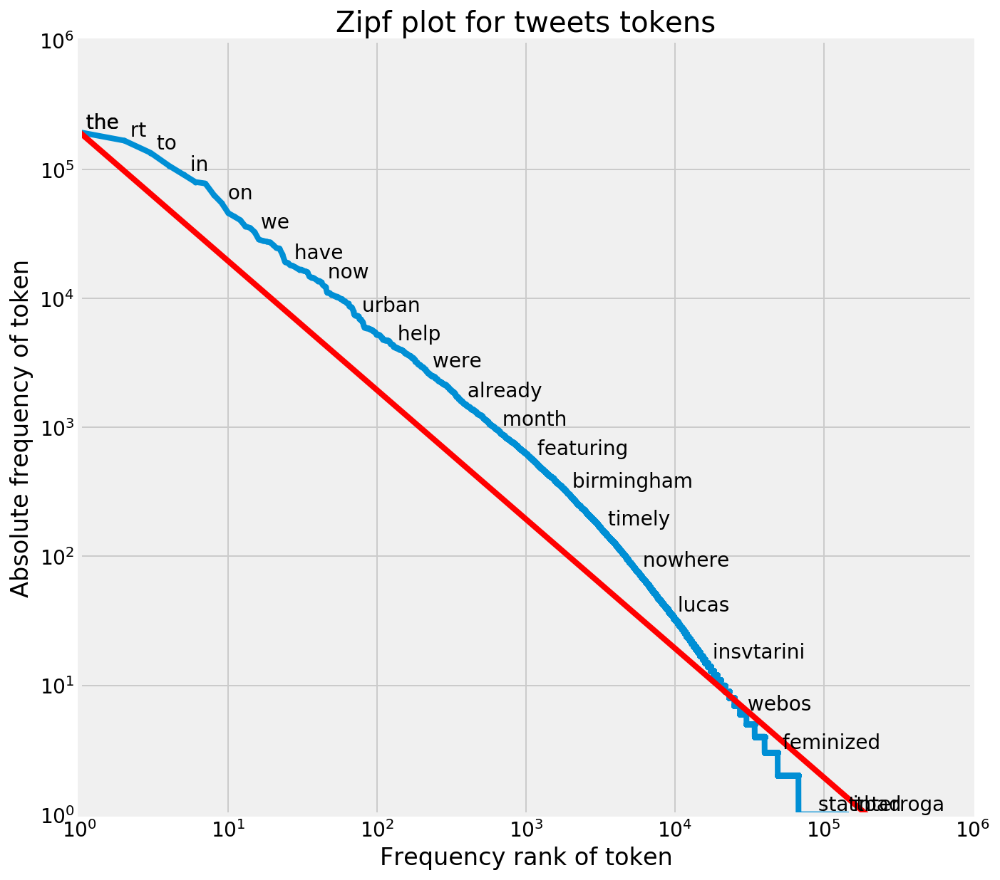

In [67]:
# Plot Zipf's law table

import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

from pylab import *
counts = term_freq_df.terms
tokens = term_freq_df.index
ranks = arange(1, len(counts)+1)
indices = argsort(-counts)
frequencies = counts[indices]
plt.figure(figsize=(10,10))
plt.rc('font', size=14)
plt.ylim(1,10**6)
plt.xlim(1,10**6)
loglog(ranks, frequencies, marker=".")
plt.plot([1,frequencies[0]],[frequencies[0],1],color='r')
title("Zipf plot for tweets tokens")
xlabel("Frequency rank of token")
ylabel("Absolute frequency of token")
grid(True)
for n in list(logspace(-0.5, log10(len(counts)-2), 25).astype(int)):
    dummy = text(ranks[n], frequencies[n], " " + tokens[indices[n]], 
                 verticalalignment="bottom",
                 horizontalalignment="left")

### Corpus Structure

In [59]:
hashtagsList = []
mentionsList = []
for tweet in english_df['text1']:
    for word in tweet.split():
        if word.startswith('#'):
            hashtagsList.append(word)
        elif word.startswith('@'):
            mentionsList.append(word)

In [65]:
corpus_structure = []
total_tokens = term_freq_df_all['terms'].sum()
words_nolhm = term_freq_df['terms'].sum()
words_stopped = term_freq_df_stopped['terms'].sum()
words_unique = term_freq_df_stopped.shape[0]
hashtags = len(hashtagsList)
mentions = len(mentionsList)
corpus_structure.append(('all terms', total_tokens))
corpus_structure.append(('terms w/o #,@,link', words_nolhm))
corpus_structure.append(('meaningful terms', words_stopped))
corpus_structure.append(('unique terms', words_unique))
corpus_structure.append(('hashtags', hashtags))
corpus_structure.append(('mentions', mentions))
print(corpus_structure)

[('all terms', 5678790), ('terms w/o #,@,link', 5148677), ('meaningful terms', 2946689), ('unique terms', 142409), ('hashtags', 251051), ('mentions', 472203)]


SCRAPED TWEETS CORPUS STRUCTURE


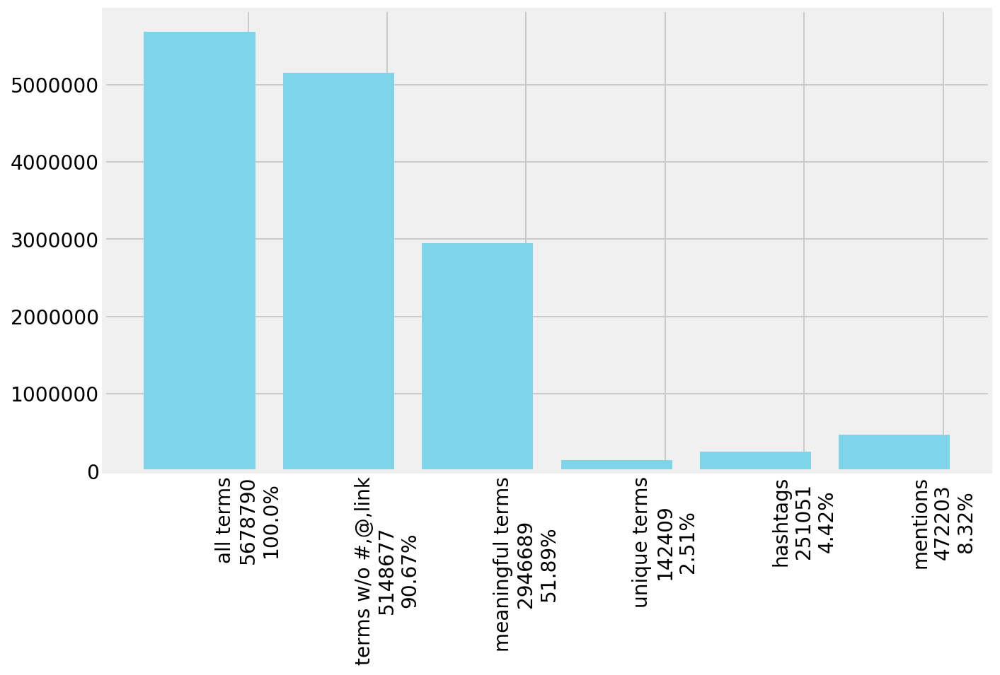

In [66]:
print('SCRAPED TWEETS CORPUS STRUCTURE')
labels, values = zip(*corpus_structure)
labelstext = [str(lab)+str('\n')+str(val)+str('\n')+str(round((val/total_tokens*100), 2))+str('%') for lab,val in corpus_structure]
# rearrange your data
labels = np.array(labelstext)
values = np.array(values)
indexes = np.arange(len(labels))
bar_width = 0.35
plt.figure(figsize=(10,6)) # set size so it can be directly saved !
plt.rc('font', size=14)
plt.bar(indexes, values, color='#7ED4E8')
# add labels
plt.xticks(indexes + bar_width, labels, rotation='vertical')
plt.show()

### Most Frequent Words

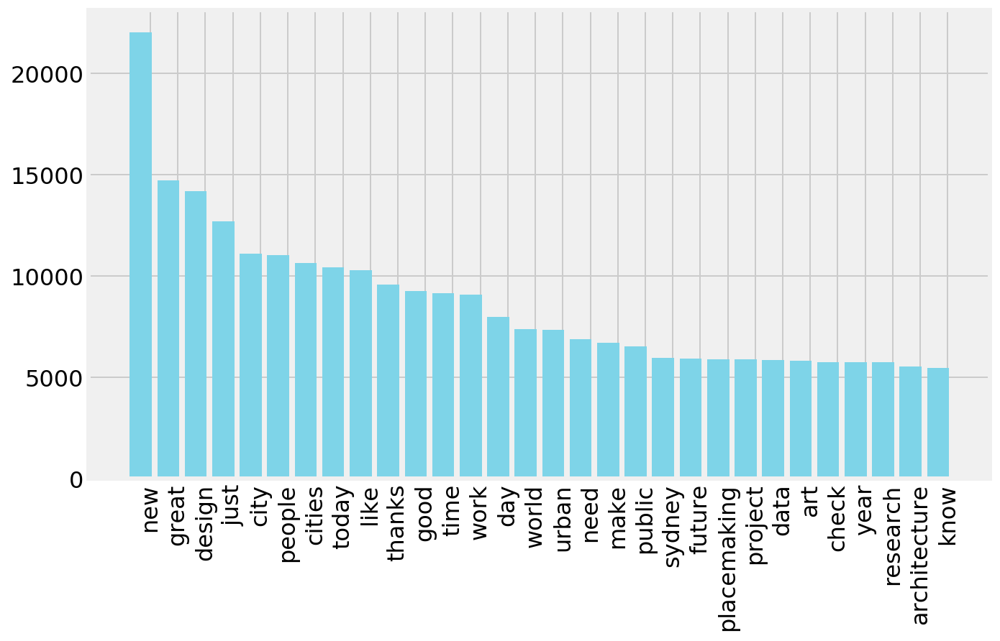

In [68]:
# thirty most frequent words appearing in the corpus (stop words removed)
popularwords = [(row[0], row[1]) for row in term_freq_df_stopped.sort_values(by='terms', ascending=False).iloc[:30].itertuples()]

labels, values = zip(*popularwords)
#print(labels, values)
# sort your values in descending order
indSort = np.argsort(values)[::-1]
# rearrange your data
labels = np.array(labels)[indSort]
values = np.array(values)[indSort]
indexes = np.arange(len(labels))
bar_width = 0.35
plt.figure(figsize=(10,6)) # set size so it can be directly saved !
plt.rc('font', size=16)
plt.bar(indexes, values, color='#7ED4E8')
# add labels
plt.xticks(indexes + bar_width, labels, rotation='vertical')
plt.show()

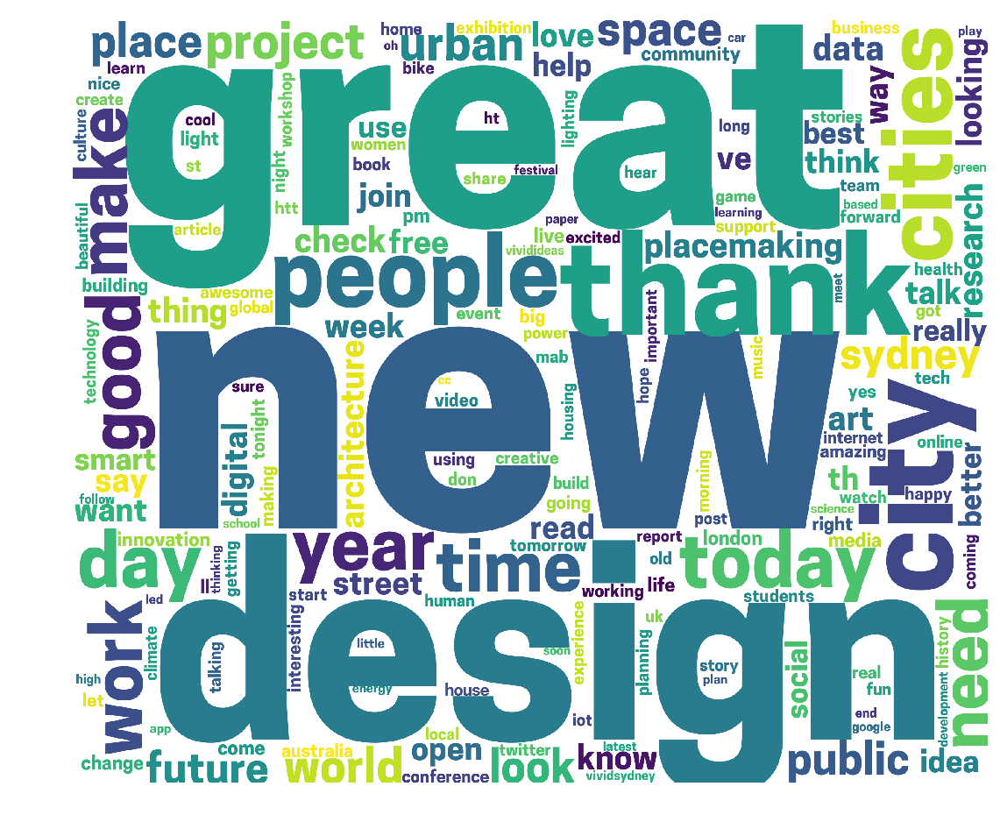

In [230]:
#### Wordcloud
from wordcloud import WordCloud
# convert text to a list of terms 
# dirty way: append term the number of times it appears in the term_freq :)
tweetlist = []
for row in term_freq_df_stopped.sort_values(by='terms', ascending=False).iloc[:200].itertuples():
    for i in range(row[1]):
        #print(row[0])
        tweetlist.append(row[0])
#print(tweetlist[:10])
words =(' '.join(tweetlist)).strip()
#print(words[:1000])
# specify fonts, stopwords, background color and other options
wordcloud = WordCloud(font_path='/Users/zoza/Library/Fonts/CooperHewitt-Bold.otf',
                          background_color='white',
                          collocations = False, # disable collocations
                          width=2400,
                          height=2000
                         ).generate(words)

plt.figure(figsize=(12,8)) # set size so it can be directly saved !
plt.imshow(wordcloud)
plt.axis('off')
plt.show()



### Co-occurrences

In [71]:
def search_coocurrences(searchword, vectorizer):
    coocurrences = []
    for key, value in vectorizer.vocabulary_.items():
        if searchword in key:
            coocurrences.append(key)
    return coocurrences

ngram_vectorizer = CountVectorizer(ngram_range=(2, 3))  # minimum 2, maximum 4 words
coocurrences = ngram_vectorizer.fit_transform(english_df.text2)
words_to_search = [i[0] for i in popularwords] # list of 30 most popular popular words
with open('co-ocurrences.txt', 'w') as f:
    for i in range(len(words_to_search)):
        #pickle.dump(search_coocurrences(words_to_search[i], ngram_vectorizer), f)
        print(search_coocurrences(words_to_search[i], ngram_vectorizer)[:10]) # first 510 co-occurences

['need new', 'new website', 'we need new', 'need new website', 'new website designs', 'good news', 'news about', 'the good news', 'good news about', 'news about retune']
['looks great', 'great would', 'really looks great', 'looks great would', 'great would love', 'had great', 'great time', 'we had great', 'had great time', 'great time at']
['website designs', 'designs are', 'new website designs', 'website designs are', 'designs are almost', 'for design', 'design more', 'randomness for design', 'for design more', 'design more info']
['just installed', 'just installed slackin', 'just learned', 'just learned that', 'cloud just', 'just other', 'no cloud just', 'cloud just other', 'just other people', 'just arrived']
['gender ethnicity', 'ethnicity related', 'to gender ethnicity', 'gender ethnicity related', 'ethnicity related priviliges', 'nice city', 'city except', 'what nice city', 'nice city except', 'city except for']
['that people', 'people care', 'happy that people', 'that people car

## Corpus Vectorization

### Word2Vec model

In [167]:
from nltk.tokenize import word_tokenize
import gensim
# X is a list of tokenized texts (i.e. list of lists of tokens)
X = [word_tokenize(item) for item in english_df['text2'].tolist()]
#print(X[0:3])
model = gensim.models.Word2Vec(X, iter=5, min_count=6, size=200) # min_count: how many times a word appears in the corpus; size: number of dimensions

In [168]:
model.wv.most_similar(positive=["digital"], topn=12)

[('hybrid', 0.5745875835418701),
 ('networked', 0.5400526523590088),
 ('communication', 0.5332859754562378),
 ('mediated', 0.532331109046936),
 ('civic', 0.5239276885986328),
 ('cultural', 0.5229194164276123),
 ('participatory', 0.5182190537452698),
 ('facades', 0.5156663656234741),
 ('museums', 0.5154826641082764),
 ('activism', 0.5136346817016602),
 ('collections', 0.5107885599136353),
 ('marketing', 0.5089868307113647)]

In [169]:
model.wv.most_similar(positive=["infrastructure"], topn=12)

[('investment', 0.7701686024665833),
 ('transportation', 0.7680805921554565),
 ('growth', 0.7659080028533936),
 ('investments', 0.7611944079399109),
 ('sector', 0.7360899448394775),
 ('mobility', 0.7286142110824585),
 ('sprawl', 0.7155700325965881),
 ('density', 0.7130412459373474),
 ('neighbourhoods', 0.7107787132263184),
 ('transport', 0.7063011527061462),
 ('improvements', 0.7029047012329102),
 ('development', 0.7020195722579956)]

In [170]:
# find the word most similar to the positive list and oposite of negative
model.wv.most_similar(positive=['city', 'policy'], negative=['people'], topn=3)

[('sustainability', 0.5548889636993408),
 ('citizenship', 0.5519601702690125),
 ('planning', 0.5479556918144226)]

In [174]:
# find the word most similar to the positive list and oposite of negative
model.wv.most_similar(positive=['city', 'placemaking'], negative=['people'], topn=1)

[('urbanism', 0.5351635813713074)]

In [175]:
model.wv.similarity('digital', 'infrastructure')

0.1319386268148652

### USING TSNE TO DISPLAY SIMILAR WORDS IN THE WORD2VEC MODEL

https://medium.com/@aneesha/using-tsne-to-plot-a-subset-of-similar-words-from-word2vec-bb8eeaea6229

In [180]:
from sklearn.manifold import TSNE

# display model funciton
def display_closestwords_tsnescatterplot(model, word):
    
    arr = np.empty(np.array([model.wv[word]]).shape, dtype='f')
    word_labels = [word]

    # get close words
    close_words = model.wv.most_similar(positive=[word], topn=20)
    
    # add the vector for each of the closest words to the array
    arr = np.append(arr, np.array([model.wv[word]]), axis=0)
    for wrd_score in close_words:
        wrd_vector = model.wv[wrd_score[0]]
        word_labels.append(wrd_score[0])
        arr = np.append(arr, np.array([wrd_vector]), axis=0)
        
    # find tsne coords for 2 dimensions
    tsne = TSNE(n_components=2, random_state=0)
    np.set_printoptions(suppress=True)
    Y = tsne.fit_transform(arr)

    x_coords = Y[:, 0]
    y_coords = Y[:, 1]
    plt.figure(figsize=(10,6))
    plt.rc('font', size=16)
    # display scatter plot
    plt.scatter(x_coords, y_coords)

    for label, x, y in zip(word_labels, x_coords, y_coords):
        plt.annotate(label, xy=(x, y), xytext=(0, 0), textcoords='offset points')
    plt.xlim(x_coords.min()+0.00005, x_coords.max()+0.00005)
    plt.ylim(y_coords.min()+0.00005, y_coords.max()+0.00005)
    plt.show()

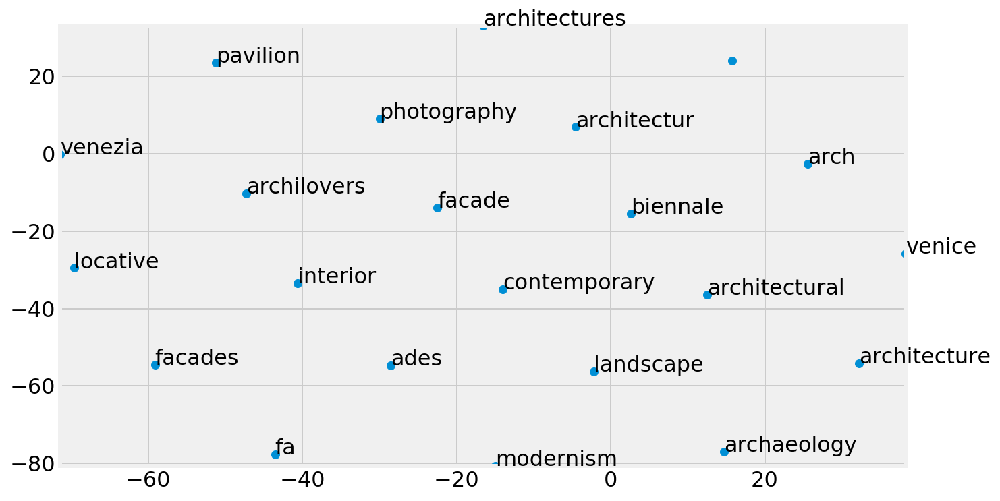

In [181]:
display_closestwords_tsnescatterplot(model, 'architecture')

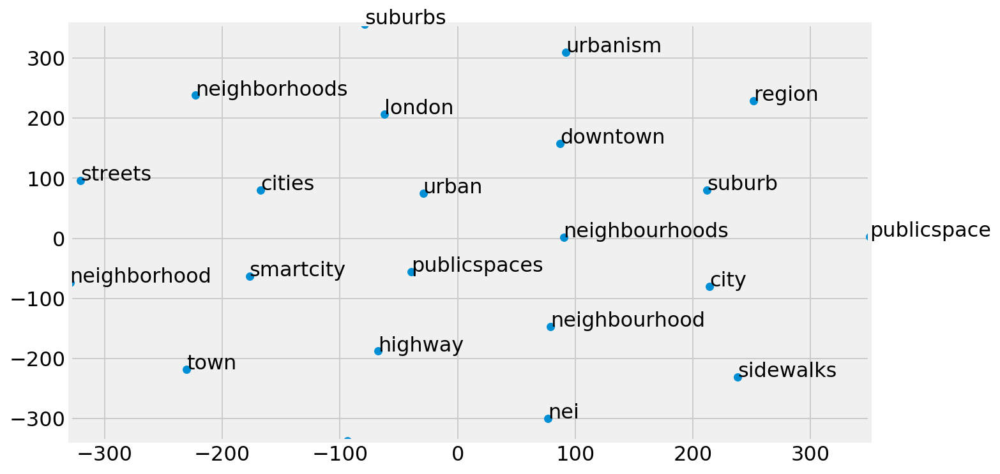

In [118]:
display_closestwords_tsnescatterplot(model, 'city')

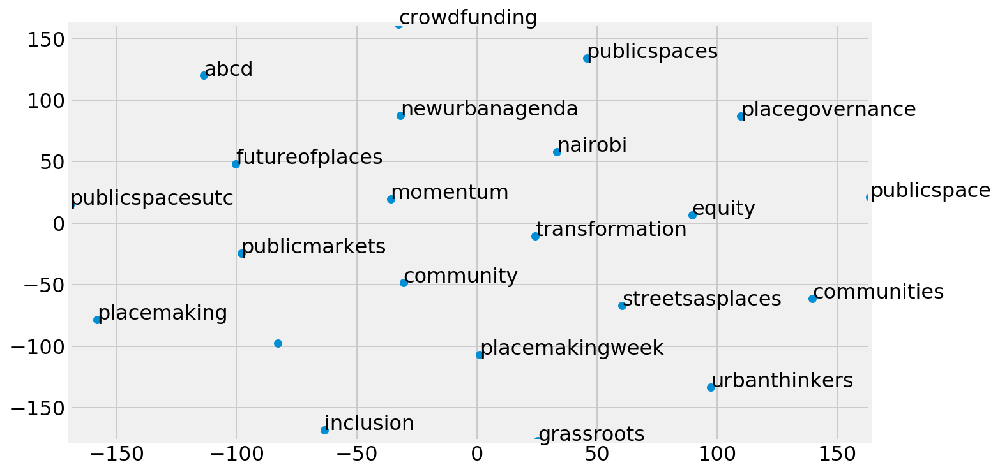

In [182]:
display_closestwords_tsnescatterplot(model, 'placemaking')

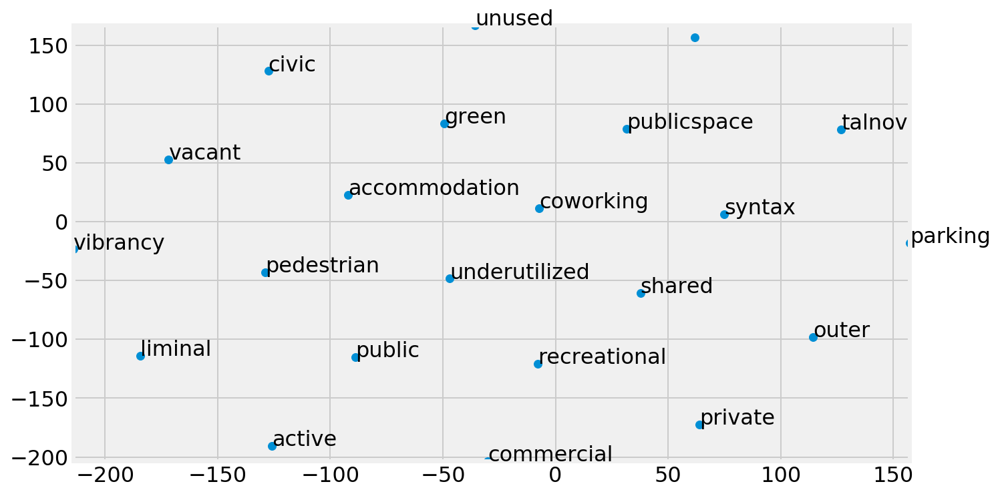

In [119]:
display_closestwords_tsnescatterplot(model, 'public')

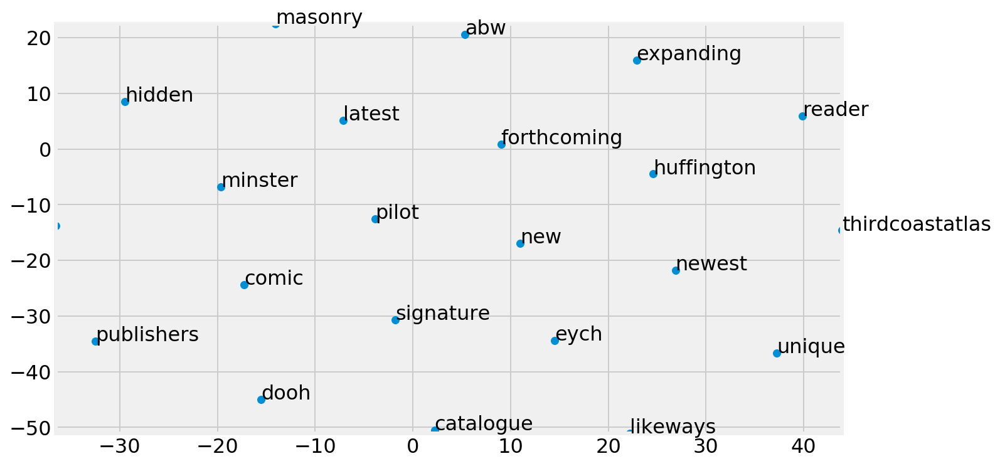

In [121]:
display_closestwords_tsnescatterplot(model, 'new')

## LDA model using scikit-learn module

In [83]:
from sklearn.feature_extraction import text as TXT
twitter_stop_words = ['rt', 'https', 'http', 'co']
stopwords = TXT.ENGLISH_STOP_WORDS.union(twitter_stop_words)

from sklearn.decomposition import NMF, LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer
 
NUM_TOPICS = 10

# data to work with: list of tweets
tweets_list = english_df['text2'].tolist()

vectorizer = CountVectorizer(min_df=5, max_df=0.9, 
                             stop_words=TXT.ENGLISH_STOP_WORDS.union(twitter_stop_words), lowercase=True, 
                             token_pattern='[a-zA-Z\-][a-zA-Z\-]{2,}')
tweets_vectorized = vectorizer.fit_transform(tweets_list)

In [84]:
# Build a Latent Dirichlet Allocation Model
lda_model = LatentDirichletAllocation(n_components=NUM_TOPICS, max_iter=10, learning_method='online')
lda_Z = lda_model.fit_transform(tweets_vectorized)
print(lda_Z.shape)  # (NO_DOCUMENTS, NO_TOPICS)


(393104, 10)


In [85]:
def print_topics(model, vectorizer, top_n=10):
    for idx, topic in enumerate(model.components_):
        print("Topic %d:" % (idx))
        print([(vectorizer.get_feature_names()[i], topic[i])
                        for i in topic.argsort()[:-top_n - 1:-1]])
 
print("LDA Model:")
print_topics(lda_model, vectorizer)
print("=" * 20)

LDA Model:
Topic 0:
[('research', 5752.642939582437), ('project', 5709.861884989653), ('great', 5682.120026953237), ('night', 3639.8932615036742), ('thank', 3209.3774274277644), ('creative', 2755.481892064914), ('workshop', 2662.713236736039), ('home', 2658.811649392118), ('like', 2459.3506734096422), ('talking', 2192.370099222644)]
Topic 1:
[('just', 8895.424889889691), ('like', 7679.089230441409), ('looking', 5213.992125518477), ('use', 4217.74890133885), ('look', 4174.602347382411), ('community', 4131.2155058899725), ('got', 3250.2033403790774), ('amazing', 3226.349627496369), ('says', 3185.5839613144667), ('forward', 2702.8809510268875)]
Topic 2:
[('new', 21708.29305855469), ('thanks', 8894.424033477677), ('check', 5479.806500859221), ('read', 4683.839699552058), ('social', 4035.8492039785206), ('media', 3802.8327328708856), ('tech', 3300.6688175908935), ('watch', 2527.690715455711), ('ideas', 2519.108560259163), ('today', 2451.701586292062)]
Topic 3:
[('work', 9374.283840264394), 

In [104]:
no_top_words = 12
no_top_documents = 10
lda_H = lda_model.components_
tf_feature_names = vectorizer.get_feature_names()

def display_topics(H, Z, feature_names, docs, no_top_words, no_top_documents):
    for idx, topic in enumerate(H):
        print("Topic %d:" % (idx))
        print("KEYWORDS", " ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
        top_doc_indices = np.argsort( Z[:,
                                        idx] )[::-1][0:no_top_documents]
        # good for checking which documents are the most characteristic for certain topics
        for doc_index in top_doc_indices:
            print("TOP DOCS", docs[doc_index])
            
display_topics(lda_H, lda_Z, tf_feature_names, tweets_list, no_top_words, no_top_documents)

Topic 0:
KEYWORDS research project great night thank creative workshop home like talking vividideas school
TOP DOCS home home home home home home home home home
TOP DOCS laughing crying laughing crying laughing crying laughing crying crying
TOP DOCS petition eu referendum rules triggering nd eu referendum over million signatures
TOP DOCS rt death by stabbing how characters most often died in shakespeare plays shakespeare
TOP DOCS black loafers white tube pressed black jeans
TOP DOCS am of practice in my own research and of research in my own practice as of research in practice
TOP DOCS rt petition eu referendum rules triggering nd eu referendum
TOP DOCS rt petition eu referendum rules triggering nd eu referendum
TOP DOCS wannacry weeping angels at aram bartholl
TOP DOCS machineresearch call for participation ph research workshop in ccoperation deadline
Topic 1:
KEYWORDS just like looking use look community got amazing says forward morning beautiful
TOP DOCS rt fly fly fly fly fly fly f

KEYWORDS design cities urban architecture placemaking future big building years better students lighting
TOP DOCS in the pavilion of kosovo biennale venezia archilovers architektur architecture venice
TOP DOCS biennale the first contents of the pavilions at the th architecture biennial in venice directed by
TOP DOCS rt rca design interactions pioneers dunne and raby reemerge at parsons
TOP DOCS rt design is enabler for jobs problem solving of future qlddesign
TOP DOCS contribute to the future of globalretail students sustainability innovation digitaltech iot
TOP DOCS find out why urban lighting is key component to the growth of smartcities
TOP DOCS inspiring building university in box in rwanda innovation
TOP DOCS cities are growing at per day architecture has to be about more than how it photographs ethicsofarchitecture
TOP DOCS why this museum lab generation is critical to learning by
TOP DOCS summary and infrastructure structure architecture in venice


#### Explore similarities

In [105]:
# fit unseen document
question = "How architects talk about digital infrastructures in social media"
x = lda_model.transform(vectorizer.transform([question]))[0]
print(x)

[0.01428571 0.01428571 0.30000006 0.29999993 0.01428571 0.01428571
 0.01428571 0.15714287 0.01428571 0.15714284]


In [106]:
# similarity
from sklearn.metrics.pairwise import euclidean_distances
 
def most_similar(x, Z, top_n=5):
    dists = euclidean_distances(x.reshape(1, -1), Z)
    pairs = enumerate(dists[0])
    most_similar = sorted(pairs, key=lambda item: item[1])[:top_n]
    return most_similar
 
similarities = most_similar(x, lda_Z)
document_id, similarity = similarities[0]
print(tweets_list[document_id][:1000])

thx but can get links to work seems to point to empty twitter pages


In [109]:
# ASK ANOTHER QUESTION
question2 = "How doES corpus analysis inform the discourse in architectural practice"
x2 = lda_model.transform(vectorizer.transform([question2]))[0]
similarities = most_similar(x2, lda_Z)
document_id, similarity = similarities[0]
print(tweets_list[document_id][:1000])

imagine museum that recreated what spaces sounded like through time


In [110]:
# ASK ANOTHER QUESTION
question3 = "What algorithms promise to identify or demonstratepatterns in discourse"
x3 = lda_model.transform(vectorizer.transform([question2]))[0]
similarities = most_similar(x3, lda_Z)
document_id, similarity = similarities[0]
print(tweets_list[document_id][:1000])

imagine museum that recreated what spaces sounded like through time


### Plot Results

In [90]:
from bokeh.io import push_notebook, show, output_notebook
from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, LabelSet
output_notebook()

Loading BokehJS ...

In [ ]:
# plotting documents in 2D
svd = TruncatedSVD(n_components=20)
documents_2d = svd.fit_transform(tweets_vectorized)
 
df = pd.DataFrame(columns=['x', 'y', 'document'])
df['x'], df['y'], df['document'] = documents_2d[:,0], documents_2d[:,1], range(len(tweets_list))
 
source = ColumnDataSource(ColumnDataSource.from_df(df))
labels = LabelSet(x="x", y="y", text="document", y_offset=8,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
 
plot = figure(plot_width=1000, plot_height=600)
plot.circle("x", "y", size=12, source=source, line_color="black", fill_alpha=0.4)
plot.add_layout(labels)
show(plot, notebook_handle=True)

In [ ]:
# plotting words in 2D
svd = TruncatedSVD(n_components=2)
words_2d = svd.fit_transform(tweets_vectorized.T)
 
CG_df1 = pd.DataFrame(columns=['x', 'y', 'word'])
CG_df1['x'], CG_df1['y'], CG_df1['word'] = words_2d[:,0], words_2d[:,1], CG_vectorizer.get_feature_names()
 
source = ColumnDataSource(ColumnDataSource.from_df(CG_df1))
labels = LabelSet(x="x", y="y", text="word", y_offset=8,
                  text_font_size="8pt", text_color="#555555",
                  source=source, text_align='center')
 
plot = figure(plot_width=600, plot_height=600)
plot.circle("x", "y", size=12, source=source, line_color="black", fill_alpha=0.8)
plot.add_layout(labels)
show(plot, notebook_handle=True)

In [92]:
import pyLDAvis.sklearn
 
pyLDAvis.enable_notebook()
panel = pyLDAvis.sklearn.prepare(lda_model, tweets_vectorized, vectorizer, mds='tsne')
panel

/Users/zoza/anaconda3/lib/python3.6/site-packages/pyLDAvis/_prepare.py:387: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  topic_term_dists = topic_term_dists.ix[topic_order]


PreparedData(topic_coordinates=            Freq  cluster  topics           x           y
topic                                                    
9      12.062959        1       1   51.828579  -51.496983
4      11.032797        1       2  -29.661098  -68.640648
5      10.454845        1       3    8.215768    5.434097
1      10.361812        1       4   93.942848   87.497978
7      10.094489        1       5  -63.789555   16.325220
8       9.931411        1       6  125.443939  -71.299599
0       9.536527        1       7    8.490396   81.696449
6       9.277349        1       8   79.377724   14.777488
3       9.071182        1       9   43.330402 -123.831490
2       8.176630        1      10  153.372849    9.640319, topic_info=      Category          Freq          Term         Total  loglift  logprob
term                                                                      
19961  Default  22464.000000           new  22464.000000  30.0000  30.0000
7841   Default  15667.000000        design  15667.000000  29.0000  29.0000
5202   Default  10744.000000          city  10744.000000  28.0000  28.0000
29652  Default   9204.000000        thanks   9204.000000  27.0000  27.0000
32904  Default   9506.000000          work   9506.000000  26.0000  26.0000
5182   Default  10169.000000        cities  10169.000000  25.0000  25.0000
16005  Default  12787.000000          just  12787.000000  24.0000  24.0000
30060  Default  10427.000000         today  10427.000000  23.0000  23.0000
17090  Default   9933.000000          like   9933.000000  22.0000  22.0000
19830  Default   7024.000000          need   7024.000000  21.0000  21.0000
29958  Default   9318.000000          time   9318.000000  20.0000  20.0000
21768  Default  11165.000000        people  11165.000000  19.0000  19.0000
31351  Default   6822.000000         urban   6822.000000  18.0000  18.0000
12727  Default  14568.000000         great  14568.000000  17.0000  17.0000
4898   Default   5671.000000         check   5671.000000  16.0000  16.0000
23443  Default   6251.000000        public   6251.000000  15.0000  15.0000
24724  Default   5730.000000      research   5730.000000  14.0000  14.0000
23228  Default   5687.000000       project   5687.000000  13.0000  13.0000
7363   Default   7976.000000           day   7976.000000  12.0000  12.0000
1589   Default   5647.000000           art   5647.000000  11.0000  11.0000
7307   Default   5754.000000          data   5754.000000  10.0000  10.0000
17501  Default   5478.000000          love   5478.000000   9.0000   9.0000
32945  Default   7410.000000         world   7410.000000   8.0000   8.0000
16354  Default   5516.000000          know   5516.000000   7.0000   7.0000
1450   Default   5760.000000  architecture   5760.000000   6.0000   6.0000
23980  Default   4847.000000          read   4847.000000   5.0000   5.0000
32302  Default   5187.000000           way   5187.000000   4.0000   4.0000
17827  Default   6931.000000          make   6931.000000   3.0000   3.0000
17418  Default   5081.000000       looking   5081.000000   2.0000   2.0000
29022  Default   6706.000000        sydney   6706.000000   1.0000   1.0000
...        ...           ...           ...           ...      ...      ...
29389  Topic10   3415.473367          tech   3416.365657   2.5036  -4.1726
32262  Topic10   2615.609380         watch   2616.501645   2.5035  -4.4394
14330  Topic10   2606.728719         ideas   2607.621009   2.5035  -4.4428
2440   Topic10   1928.132535         based   1929.024832   2.5034  -4.7444
22494  Topic10   1536.265585         point   1537.157865   2.5033  -4.9716
12579  Topic10   1526.583441    government   1527.475750   2.5033  -4.9779
270    Topic10   1388.670013        action   1389.562310   2.5032  -5.0726
6726   Topic10   1379.870880      creating   1380.763175   2.5032  -5.0790
4774   Topic10   1364.525567     challenge   1365.417852   2.5032  -5.0901
4703   Topic10   1364.208494        centre   1365.100758   2.5032  -5.0904
1632   Topic10   1356.999735        

## SOM Implementations

### MINISOM implementation

https://github.com/JustGlowing/minisom

In [93]:
from minisom import MiniSom    
map_dim = 10
som = MiniSom(map_dim, map_dim, 100, sigma=1.0, random_seed=1)
#som.random_weights_init(W)
som.train_batch(model.wv.vectors, 100)

In [94]:
qnt = som.quantization(model.wv.vectors)
print(len(qnt))

30256


[]

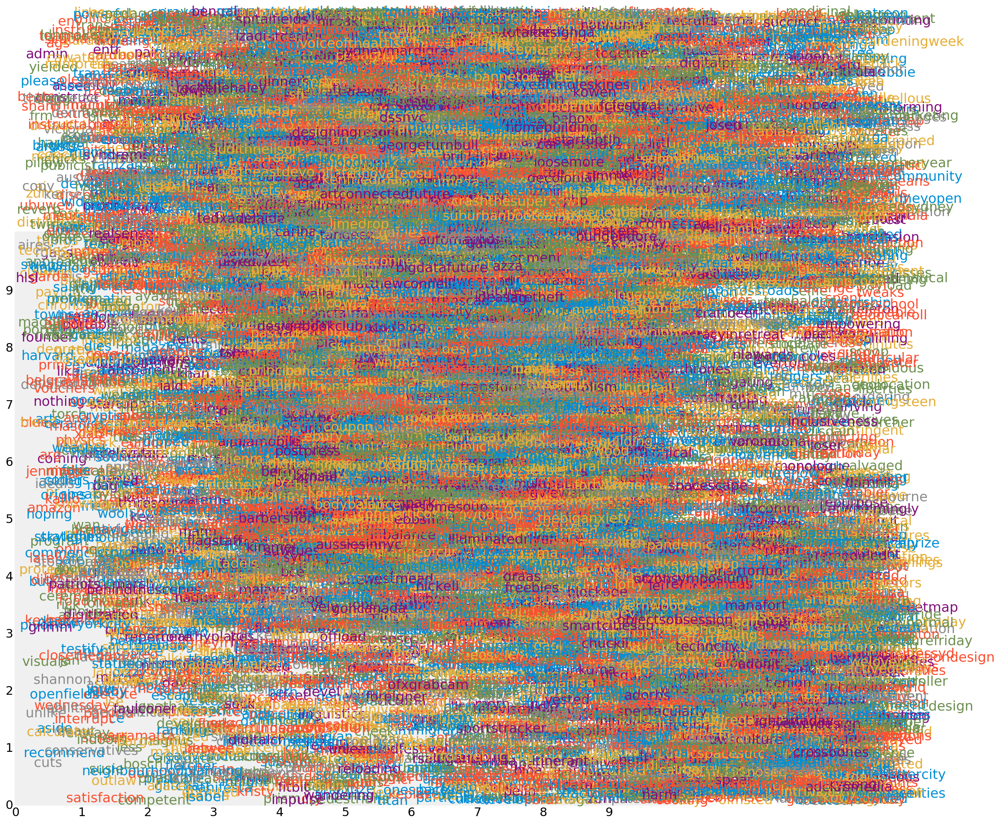

In [95]:
import random
plt.figure(figsize=(14, 14))
colors=['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
for vec, t in zip(model.wv.vectors, model.wv.vocab.keys()):
    winnin_position = som.winner(vec)
    plt.text(winnin_position[0]+np.random.rand()*3.8, 
             winnin_position[1]+np.random.rand()*4.8, t, fontsize=18, color=random.choice(colors))

plt.xticks(range(map_dim))
plt.yticks(range(map_dim))
plt.grid()
plt.xlim([0, map_dim])
plt.ylim([0, map_dim])
plt.plot()

### SOMPY implementation

https://github.com/sevamoo/data_driven_modeling_2018/blob/master/04_Clustering_Kmeans_SOM_20180327.ipynb

In [215]:
import sys
sys.path.append('..')
                
import sompylib3.sompy as SOM
msz11 =53
msz10 = 53
M = model.wv.vectors
som1 = SOM.SOM('', M, mapsize = [msz10, msz11],norm_method = 'var',initmethod='pca')
som1.init_map()
som1.train(n_job = 1, shared_memory = 'no',verbose='final')


Total time elapsed: 22.597000 secodns
final quantization error: 6.283842


'\nWIKIPEDIA:\nThe U-matrix (unified distance matrix) is a representation of a self-organizing map (SOM) \nwhere the Euclidean distance between the codebook vectors of neighboring neurons \nis depicted in a grayscale image. This image is used to visualize the data in a \nhigh-dimensional space using a 2D image.\n'

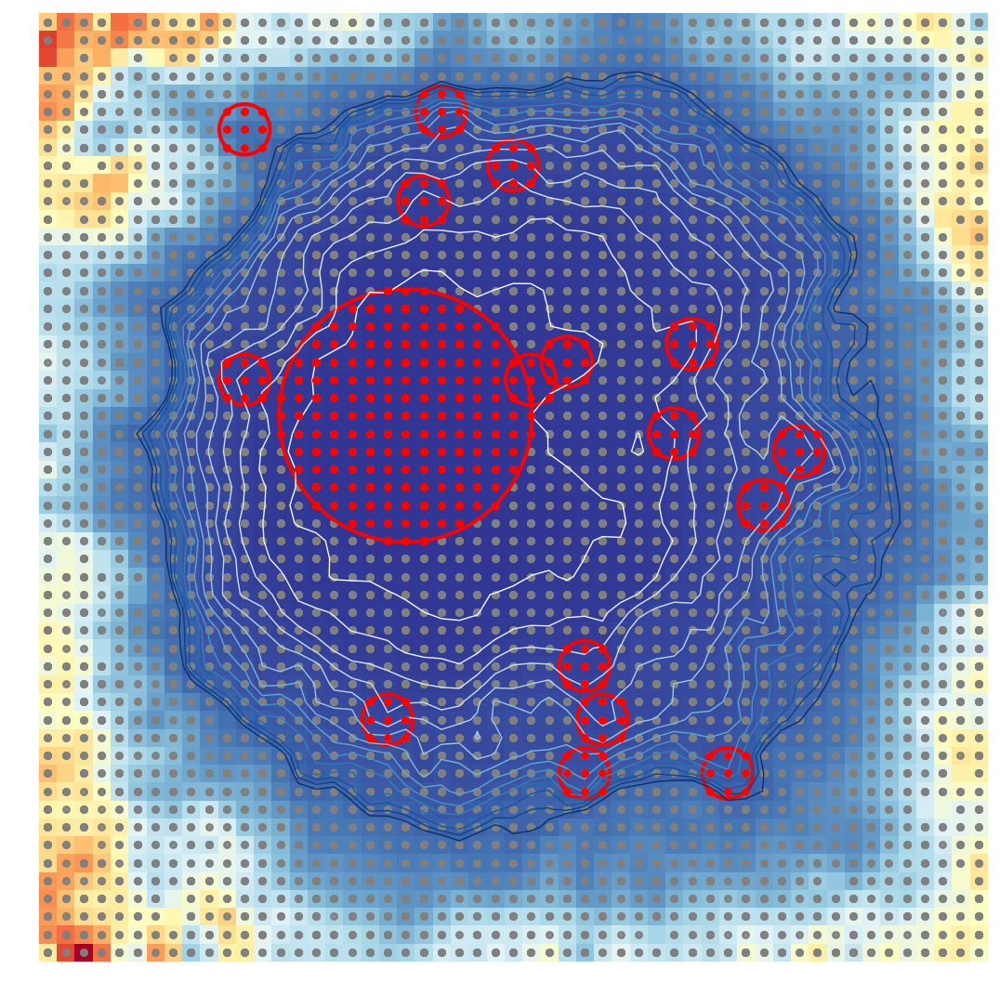

In [154]:
# Umatrix finds the clusters 
U = som1.view_U_matrix(distance2=1, row_normalized='No', show_data='Yes', contooor='Yes', blob='Yes', save='NO', save_dir='')

'''
WIKIPEDIA:
The U-matrix (unified distance matrix) is a representation of a self-organizing map (SOM) 
where the Euclidean distance between the codebook vectors of neighboring neurons 
is depicted in a grayscale image. This image is used to visualize the data in a 
high-dimensional space using a 2D image.
'''

../sompylib3/sompy.py:1089: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  norm = matplotlib.colors.Normalize(vmin=DD.ix['3%'], vmax=DD.ix['97%'], clip=False)


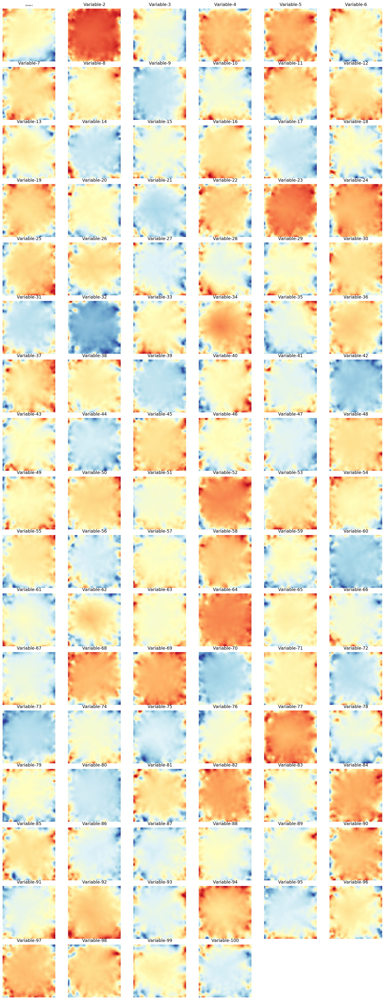

In [151]:
# Displays instances of the model space (100) ?
P = som1.view_map(text_size=8, text='Yes')

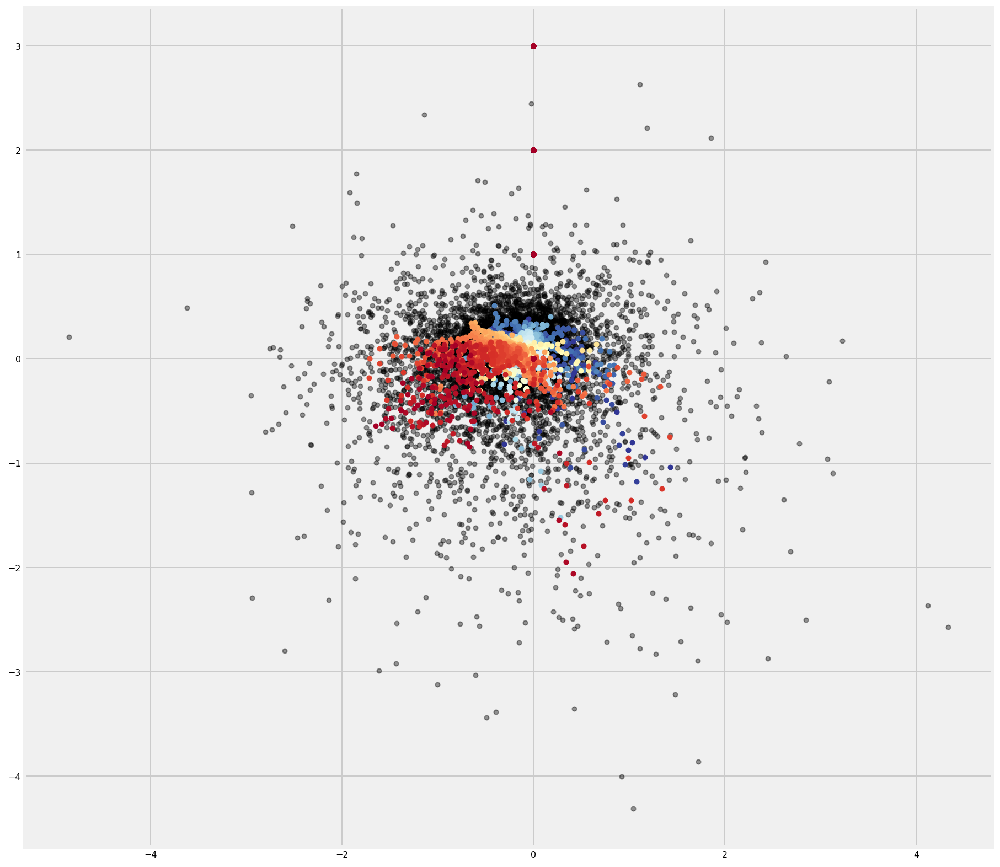

In [156]:
## codebook1 = som1.codebook[:]
codebook1_n = SOM.denormalize_by(som1.data_raw, codebook1, n_method = 'var')

fig = plt.figure()
plt.plot(X[:,0],X[:,1],'ok',alpha=0.4, markersize=4);
K = som1.nnodes
for k in range(som1.nnodes):
    plt.plot(codebook1_n[k,0],codebook1_n[k,1],data_labels[k],marker='o',markersize=4,alpha=1.,color=plt.cm.RdYlBu_r(float(k)/K));
fig.set_size_inches(14,14)

In [196]:
# train SOM on documents instead of words

class LabeledLineSentence(object):

    def __init__(self, doc_list, labels_list):

        self.labels_list = labels_list
        self.doc_list = doc_list

    def __iter__(self):

        for idx, doc in enumerate(self.doc_list):
              yield gensim.models.doc2vec.TaggedDocument(doc,[self.labels_list[idx]])

it = LabeledLineSentence(X, tweets_list) # first value list of lists of words; second value list of 'labels' which here are actual tweets
docmodel = gensim.models.Doc2Vec(vector_size=300, min_count=0, alpha=0.025, min_alpha=0.025)
docmodel.build_vocab(it)

In [197]:
# training of model
for epoch in range(10):
    print('iteration '+str(epoch+1))
    docmodel.train(it, total_examples=docmodel.corpus_count, epochs=1)
    docmodel.alpha -= 0.002
    docmodel.min_alpha = docmodel.alpha

iteration 1
iteration 2
iteration 3
iteration 4
iteration 5
iteration 6
iteration 7
iteration 8
iteration 9
iteration 10


In [199]:
#saving the created model
docmodel.save('doc2vec.model')

In [218]:
similar_doc = docmodel.docvecs.most_similar([docmodel['architecture']]) 

print(similar_doc)

[('alternative futures for media via and', 0.5311791300773621), ('the dubious gestalt theory in interactive media design by graham', 0.46469226479530334), ('from fundamentals of computational media design ping', 0.4616200029850006), ('rt first prize in dooh techniques to liveposter with total media for playwithourpixels', 0.45583483576774597), ('livegreenblog at ifla forum landscape and media', 0.4394497871398926), ('rt offering dooh media firsts is not sustainable model dailydoohmediasummit', 0.42211878299713135), ('at the media launch for the completion of the frank gehry business school surrounded by old and new', 0.41762420535087585), ('rt new oslo installation reflects norwegian landscape in miniature', 0.412645161151886), ('rt media archeology is counter historical according to wolfgang ernst tm searchforamethod mediaart', 0.41083282232284546), ('is new media lightedu', 0.4101618826389313)]


In [225]:
# train the SOM on the doc2vec model
msz11 = 53
msz10 = 53
DM = docmodel.docvecs.vectors_docs
som2 = SOM.SOM('', DM, mapsize = [msz10, msz11],norm_method = 'var',initmethod='pca')
som2.init_map()
som2.train(n_job = 1, shared_memory = 'no',verbose='final')


Total time elapsed: 83.934000 secodns
final quantization error: 15.059812


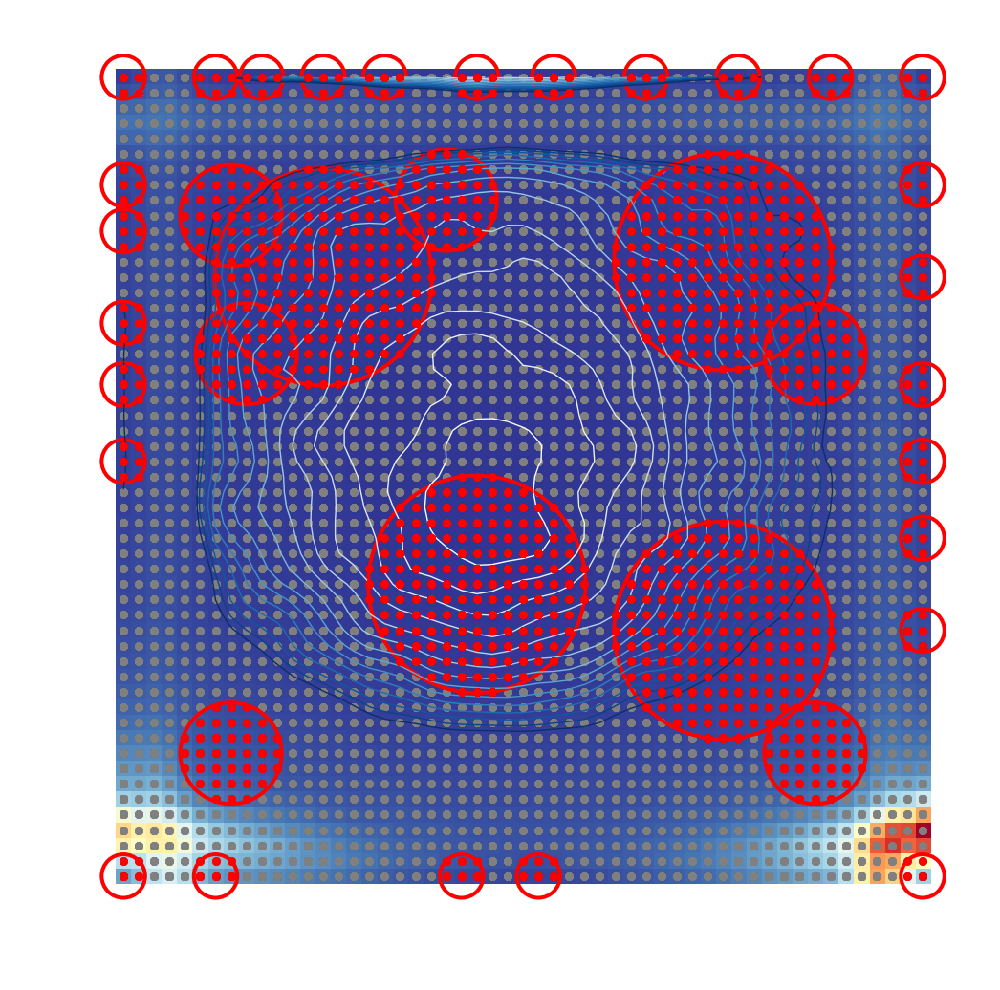

In [226]:
# Umatrix finds the clusters 
U2 = som2.view_U_matrix(distance2=1, row_normalized='No', show_data='Yes', contooor='Yes', blob='Yes', save='NO', save_dir='')